# [CSCE 508] HW02: Image Registration & Segmentation

**Points:** 100 points

**Posted:** Tue, Feb 18, 2025

**Due:** 5PM, Thur, Mar 06, 2025

**Submission:** please rename the .ipynb file as __HW02_C00XXXXXX_FirstName_LastName.ipynb__ and submit it to **Moodle**.


# <b> 0. Preparation </b>


## Download Images

In [255]:
# download image
! wget -O examplar-001-01.jpg https://raw.githubusercontent.com/hzaoheng123/HZ/main/teaching/sample_images/exemplar-001-cycle-01.ome0000.jpg

! wget -O exemplar-001-03.jpg https://raw.githubusercontent.com/hzaoheng123/HZ/main/teaching/sample_images/exemplar-001-cycle-03.ome0000.jpg

! wget -O view_1.jpg https://raw.githubusercontent.com/hzaoheng123/HZ/main/teaching/sample_images/HW02_view_1.jpg

! wget -O view_2.jpg https://raw.githubusercontent.com/hzaoheng123/HZ/main/teaching/sample_images/HW02_view_2.jpg


--2025-02-24 22:28:45--  https://raw.githubusercontent.com/hzaoheng123/HZ/main/teaching/sample_images/exemplar-001-cycle-01.ome0000.jpg
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 264085 (258K) [image/jpeg]
Saving to: ‘examplar-001-01.jpg’

examplar-001-01.jpg 100%[===================>] 257.90K  --.-KB/s    in 0.04s   

2025-02-24 22:28:45 (6.59 MB/s) - ‘examplar-001-01.jpg’ saved [264085/264085]

--2025-02-24 22:28:45--  https://raw.githubusercontent.com/hzaoheng123/HZ/main/teaching/sample_images/exemplar-001-cycle-03.ome0000.jpg
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.110.133, 185.199.111.133, 185.199.109.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.110.133|:443... connected.
HT

In [256]:
# auxilary functions for visualization and processing
import numpy as np
import matplotlib.pyplot as plt
import cv2
from imageio import imread, imwrite
from PIL import Image
from IPython.display import Image as Image_dsp


def plotImgPair(img1, img2, cm = 'gray', title=['','']):
    fig, ax = plt.subplots(1, 2, figsize=(15, 20))
    for i,a in enumerate(ax):
        a.set_axis_off()
        if title[i] != '':
            a.set_title(title[i])
    ax[0].imshow(img1, cmap=cm)
    ax[1].imshow(img2, cmap=cm)

def autoContrast(I, thres=[1,99]):
    # compute percentile: remove too big or too small values
    I_low, I_high = np.percentile(I.reshape(-1), thres)
    # thresholding
    I[I > I_high] = I_high
    I[I < I_low] = I_low
    # scale to 0-1
    I = (I.astype(float)- I_low)/ (I_high-I_low)
    # convert it to uint8
    I = (I * 255).astype(np.uint8)
    return I

def dispGif(img1, img2, filename='tmp.gif'):
    im1 =  Image.fromarray(img1)
    im2 =  Image.fromarray(img2)
    im1.save(filename, format='GIF',
                   append_images=[im2],
                   save_all=True,
                   duration=300, loop=0)
    return Image_dsp(open(filename,'rb').read())


## Visualize image pairs

<ipython-input-257-029dd8c67212>:4: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  img1 = autoContrast(imread('examplar-001-01.jpg')[:512,:512])
<ipython-input-257-029dd8c67212>:5: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  img2 = autoContrast(imread('exemplar-001-03.jpg')[:512,:512])


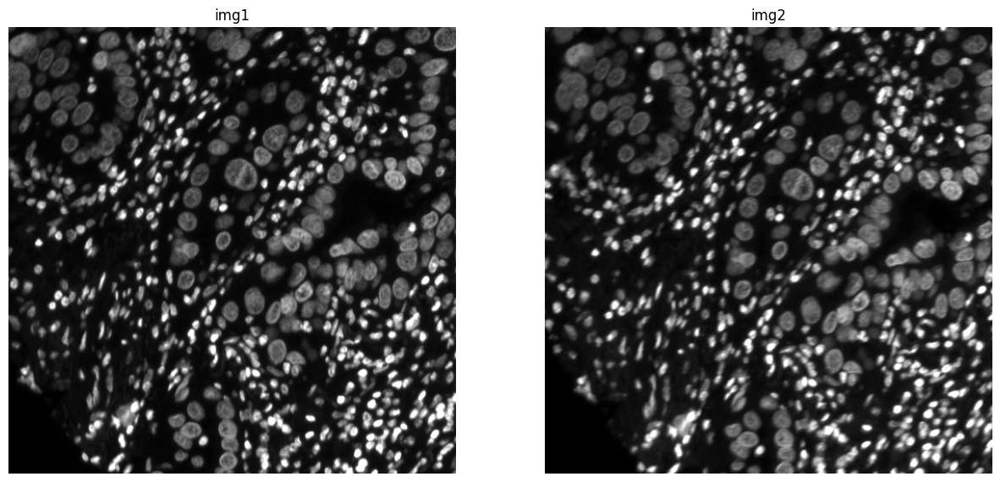

In [257]:
import sys
sys.path.append('./')

img1 = autoContrast(imread('examplar-001-01.jpg')[:512,:512])
img2 = autoContrast(imread('exemplar-001-03.jpg')[:512,:512])

# "plotImgPair()" defined in auxilary functions
# hard to tell the difference
plotImgPair(img1, img2, title=['img1', 'img2'])

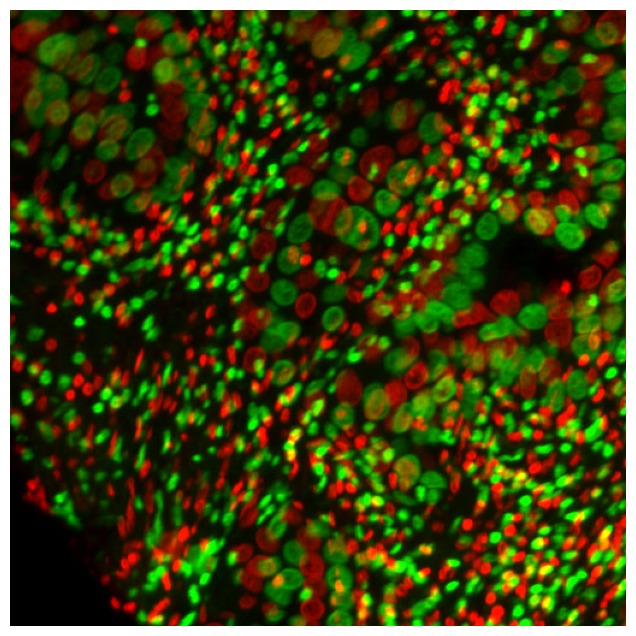

In [258]:
# RGB visualization
sz = img1.shape
out = np.zeros([sz[0], sz[1], 3], np.uint8)
out[:,:, 0] = img1
out[:,:, 1] = img2

plt.figure(figsize=(8, 8))
plt.imshow(out);plt.axis('off')
plt.show()

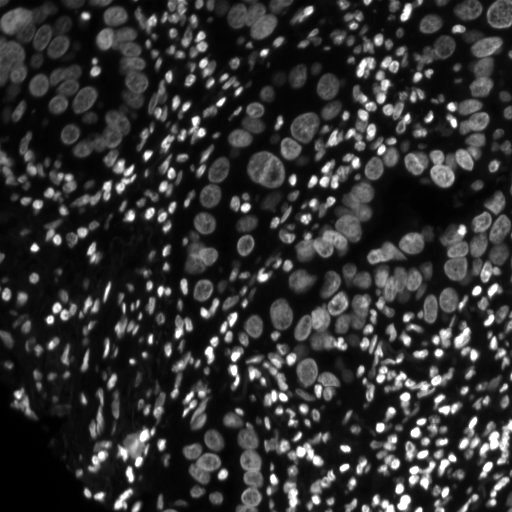

In [259]:
# GIF visualization
dispGif(img1, img2)

# <b>1. Image Transformation (16 pts) </b>


## 1.1 Point cloud representation

In [260]:
import numpy as np

im_size = [3,3]
I = 100 * np.arange(np.prod(im_size)).reshape(im_size)

print('Matrix representation:\n', I)

[x,y] = np.meshgrid(np.arange(im_size[0]), np.arange(im_size[1]))

print('------------')
print('Point cloud representation (x,y,I):')
print(np.hstack([x.reshape(-1,1),y.reshape(-1,1),I.reshape(-1,1)]))

Matrix representation:
 [[  0 100 200]
 [300 400 500]
 [600 700 800]]
------------
Point cloud representation (x,y,I):
[[  0   0   0]
 [  1   0 100]
 [  2   0 200]
 [  0   1 300]
 [  1   1 400]
 [  2   1 500]
 [  0   2 600]
 [  1   2 700]
 [  2   2 800]]


## 1.2 [4 pts] Transformation
The benefit of forward warping is that it's straightforward to visualize what happens to the pixels.

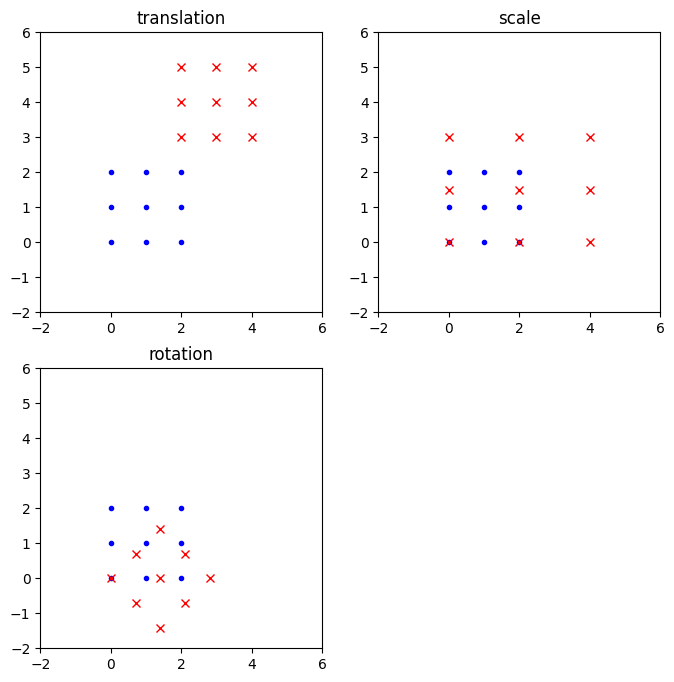

In [261]:
import matplotlib.pyplot as plt

T_trans = np.array([[1,0,2],[0,1,3]])
T_scale = np.array([[2,0,0],[0,1.5,0]])
theta= 45/180*np.pi
T_rotate = np.array([[np.cos(theta),np.sin(theta),0],\
                     [-np.sin(theta),np.cos(theta),0]])


T=[T_trans, T_scale, T_rotate]
names=['translation','scale','rotation']

plt.figure(figsize=(8, 8))

for i,t in enumerate(T):
    plt.subplot(2,2,i+1)
    plt.plot(x.reshape(-1), y.reshape(-1),'b.')
    ### Your code starts here ###

    # Convert to homogenous coordinates
    pos:  list =  [(x[j], y[j], 1) for j in range(len(x))]

    # Apply transformation manually # Extract x and y coordinates separately
    pos2: list =  list(
                    # For each pixel in row,
                    zip(*[
                      # For each row in image,
                      [
                        sum(
                              # Apply transformation
                              t[row][col] * p[col] for col in range(3)
                        ) for row in range(2)
                      ] for p in pos
                    ])
                  )

    ### Your code ends here ###
    plt.plot(pos2[0], pos2[1],'rx')
    plt.xlim([-2,6])
    plt.ylim([-2,6])
    plt.title(names[i])

## 1.3 [12 pts] Exercise


### (1) [8 pts] Visualize an affine transformation

We showed how to plot the forward warping with translation, scale, and rotation. Here, write down an arbitrary affine transformation matrix and transform the points.

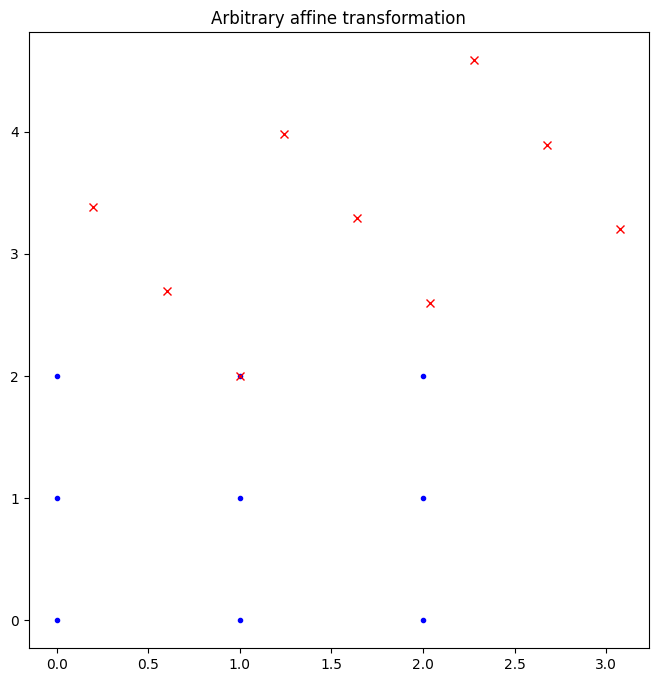

In [262]:
# make image (dots) to test on
im_size = [3,3]
I = 100 * np.arange(np.prod(im_size)).reshape(im_size)
[x,y] = np.meshgrid(np.arange(im_size[0]), np.arange(im_size[1]))
pos = np.vstack([x.reshape(-1), y.reshape(-1), np.ones(y.size)])

plt.figure(figsize=(8, 8))
plt.plot(x.reshape(-1), y.reshape(-1),'b.')

### Your code starts here

# Define an affine transformation matrix
theta:    float = 30 / 180 * np.pi  # 30-degree rotation

T_affine: list =  [   # Scale & translate each pixel
                      [np.cos(theta) * 1.2, -np.sin(theta)  * 0.8,  1],
                      [np.sin(theta) * 1.2, np.cos(theta)   * 0.8,  2],
                      [0,                   0,                      1]
                  ]

# Apply transformation manually # Extract x and y coordinates separately
pos2:     list =  list(
                    # For each pixel in row,
                    zip(*[
                      # For each row in image,
                      [
                        sum(
                              # Apply transformation
                              T_affine[row][col] * p[col] for col in range(3)
                        ) for row in range(2)
                      ] for p in zip(*pos)
                    ])
                  )

### Your code ends here

plt.plot(pos2[0], pos2[1],'rx')
plt.title('Arbitrary affine transformation')
plt.show()


### (2) [4 pts] Bilinear interpolation

In [263]:
def bilinearInterp(mat, pos):
    # mat: [[I0,I1],[I2,I3]], 2x2 numpy matrix with values at four corners
    # pos: (\alpha, \beta), numpy array for the position
    val = 0

    ### Your code starts here

    # Extract matrix values
    I0:   int =   mat[0,0]
    I1:   int =   mat[0,1]
    I2:   int =   mat[1,0]
    I3:   int =   mat[1,1]

    # Extract interpolation components
    a:    float = pos[0]
    b:    float = pos[1]

    # Apply bilinear interpolation formula
    val:  float = (
                    ((1 - a) * (1 - b) * I0)
                    + (a * (1 - b)     * I1)
                    + ((1 - a) * b     * I2)
                    + (a * b           * I3)
                  )

    ### Your code ends here
    return val

## test case

test_mat = np.array([[50,100],[150,200]])
test_pos = [0.7, 0.3]

print(bilinearInterp(test_mat, test_pos))

115.0


# <b>2. Transformation estimation (30 pts) </b>

## 2.1 [6 pts] Template matching

Please use **functions in cv2** library to achieve the following goals.

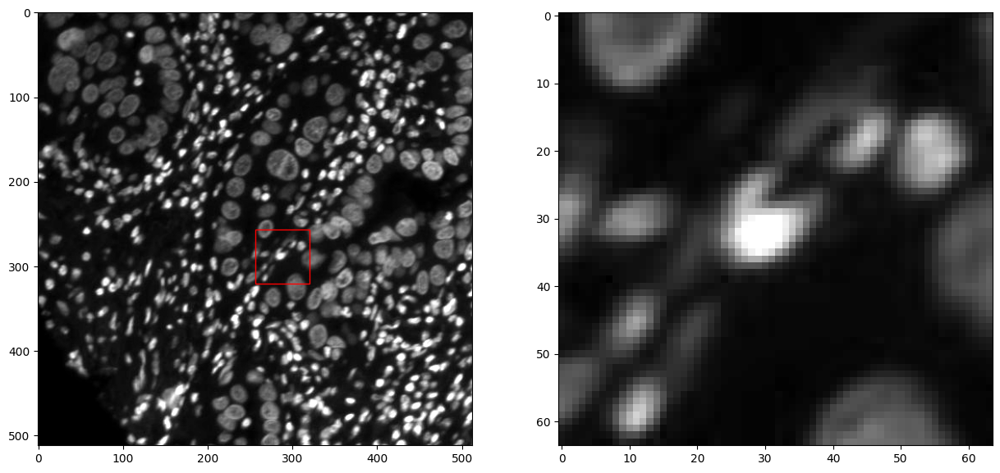

In [264]:
import cv2

crop_start = [256,256]
crop_size = [64,64]
img2_template = img2[crop_start[0] : crop_start[0] + crop_size[0],\
                    crop_start[1] : crop_start[1] + crop_size[1]]


fig, (ax1,ax2) = plt.subplots(ncols=2, figsize=(15, 20))
ax1.imshow(img2, cmap='gray')
rect = plt.Rectangle((crop_start[0], crop_start[1]), crop_size[0], crop_size[1], edgecolor='r', facecolor='none')
ax1.add_patch(rect)
ax2.imshow(img2_template, cmap='gray')


### (a) [3 pts] Cross-correlation
(same as convolution, except no flipping kernel)

<img src="https://docs.opencv.org/2.4/_images/math/93f1747a86a3c5095a0e6a187442c6e2a0ae0968.png">

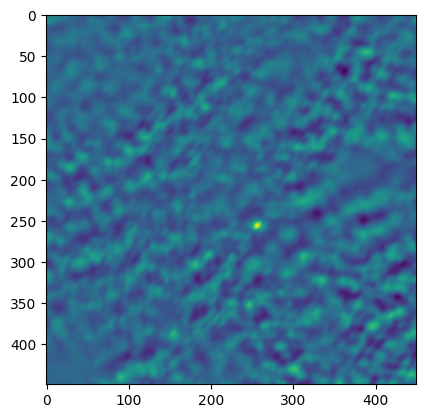

In [265]:
# the maximum location is at the bottom-right border
# the result won't be bad if we increase the crop size

### Your code starts here ###

# Generate heat map of image cross correlation
heatmap_cc =  cv2.matchTemplate(img2, img2_template, cv2.TM_CCOEFF)

### Your code ends here ###

plt.imshow(heatmap_cc)

### (b) [3 pts] Normalized Cross-correlation
For each patch, divide the correlations result by the norm of both patches.

<img src="https://docs.opencv.org/2.4/_images/math/6a72ad9ae17c4dad88e33ed16308fc1cfba549b8.png">

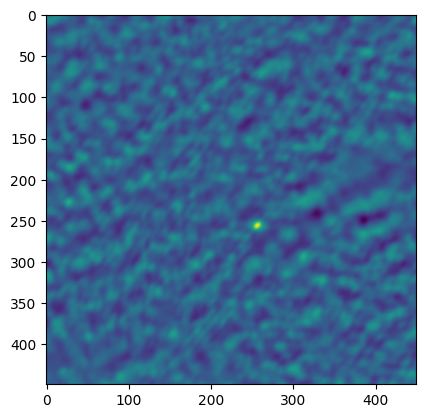

In [266]:
# now the maximum
### Your code starts here ###

# Generate heat map of normalized image cross correlation
heatmap_ncc = cv2.matchTemplate(img2, img2_template, cv2.TM_CCOEFF_NORMED)

### Your code ends here ###

plt.imshow(heatmap_ncc)

### (c) Visualize the result

shift by: (0,0)


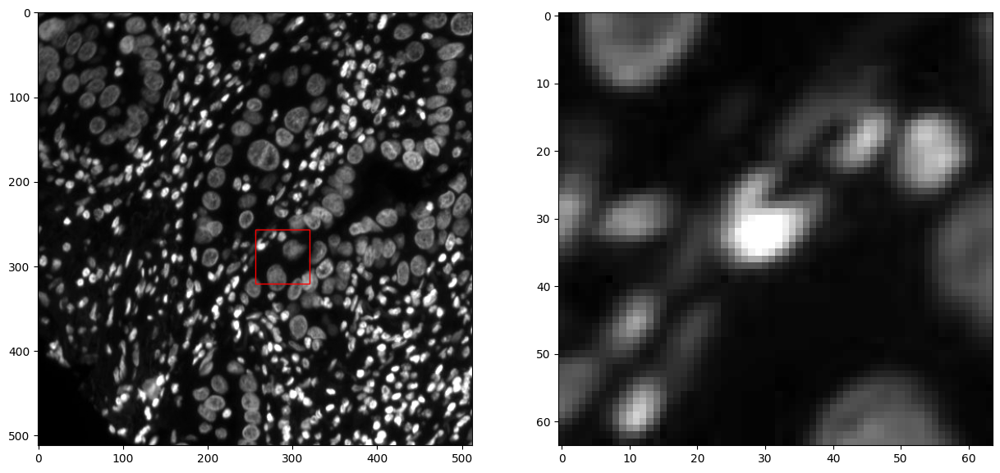

In [267]:
ij = np.unravel_index(np.argmax(heatmap_ncc), heatmap_ncc.shape)
match_x, match_y = ij[::-1]

print('shift by: (%d,%d)' % (match_x-crop_start[0], match_y-crop_start[1]))

fig, (ax1,ax2) = plt.subplots(ncols=2, figsize=(15, 20))
ax1.imshow(img1, cmap='gray')
rect = plt.Rectangle((match_x, match_y), crop_size[0], crop_size[1], edgecolor='r', facecolor='none')
ax1.add_patch(rect)

ax2.imshow(img2_template, cmap='gray')

### (d) Warp img2

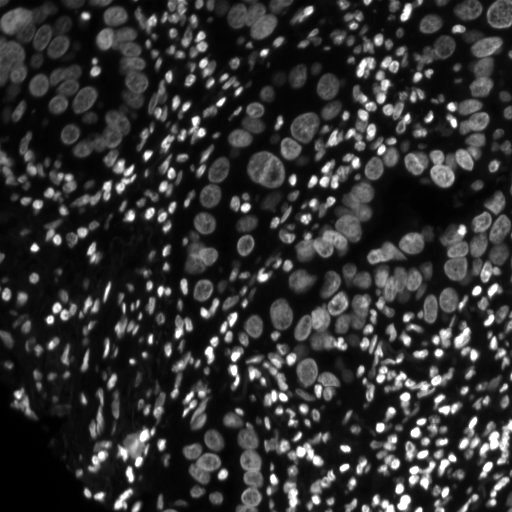

In [268]:
A = np.ones([2,3])
A[1,0] = 0
A[0,1] = 0
A[0,2] = -crop_start[0] + match_x
A[1,2] = -crop_start[1] + match_y

img2_trans = cv2.warpAffine(img2, A, img1.shape)

dispGif(img1, img2_trans)

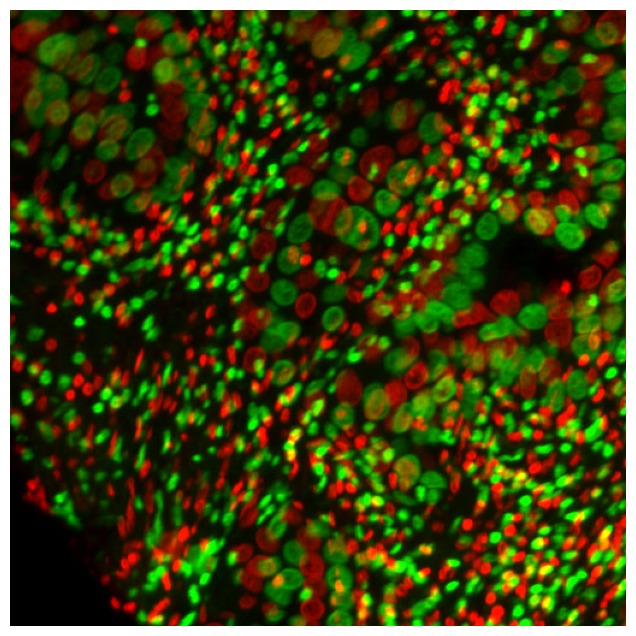

In [269]:
# Note that the rgb visualization is not as sensitive to show the error
out = np.zeros([img1.shape[0], img1.shape[1], 3], np.uint8)
out[:,:, 0] = img1
out[:,:, 1] = img2_trans

plt.figure(figsize=(8, 8))
plt.imshow(out);plt.axis('off')
plt.show()

## 2.2 3-Step Pipeline

### (a) Step 1. Get the key points

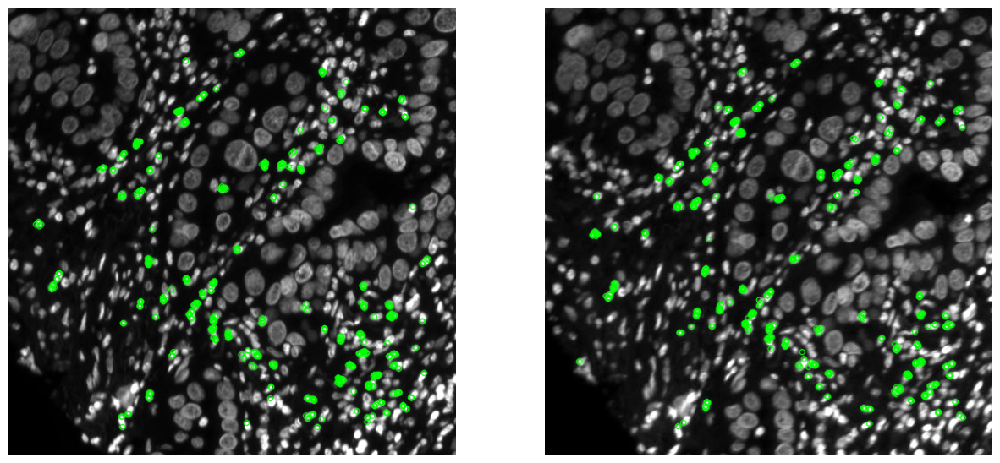

In [270]:
import cv2
def get_orb_features(img):
    '''
    Compute ORB features using cv2 library functions (hint: you will need cv2.ORB_create() and some related functions).  Use default parameters when computing the keypoints.
    Input:
      img: cv2 image
    Returns:
      keypoints: a list of cv2 keypoints
      descriptors: a list of ORB descriptors
    '''
    orb = cv2.ORB_create()
    keypoints, descriptors = orb.detectAndCompute(img, None)
    return keypoints, descriptors


kp_1, desc_1 = get_orb_features(img1)
kp_2, desc_2 = get_orb_features(img2)

kp_img1 = cv2.drawKeypoints(img1, kp_1, None, color=(0,255,0), flags=0)
kp_img2 = cv2.drawKeypoints(img2, kp_2, None, color=(0,255,0), flags=0)

plotImgPair(kp_img1, kp_img2)

### (b) Step 2. Find matches among key points

orb feature matches


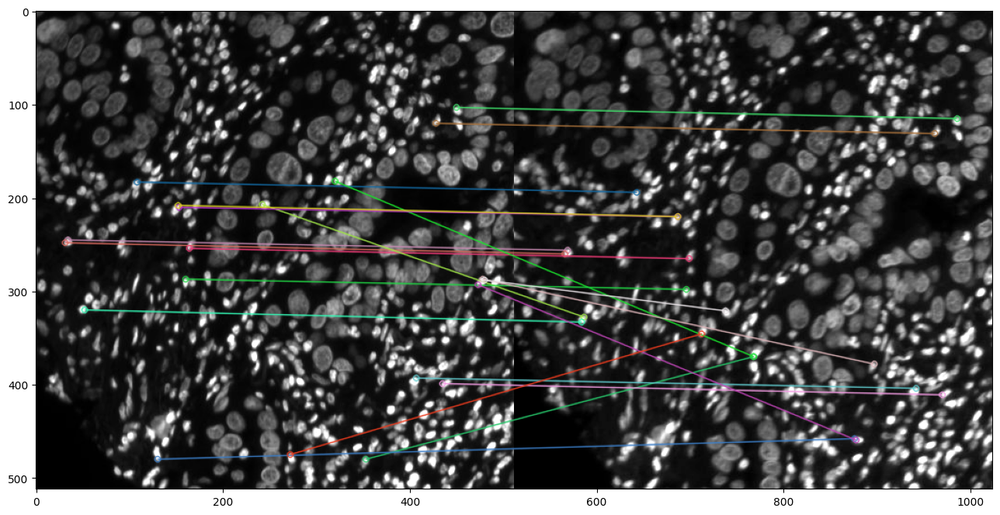

In [271]:
def match_keypoints(desc_1, desc_2):
    '''
    Compute matches between feature descriptors of two images using ratio test.
    You may use cv2 library functions.(hint: you may need to use cv2.DescriptorMatcher_create or cv2.BFMatcher and some related functions)
    Input:
      desc_1, desc_2: list of feature descriptors
    Return:
      matches: list of feature matches
    '''
    matcher = cv2.DescriptorMatcher_create("BruteForce-Hamming")
    matches = matcher.match(desc_1, desc_2)
    return matches

# display the top-20 matches
# note that some matches are quite off (e.g., big tree branches in the left image)
matches = match_keypoints(desc_1, desc_2)
match_plot = cv2.drawMatches(img1, kp_1, img2, kp_2, matches[:20], None, flags=2)
print("orb feature matches")

plt.figure(figsize=(16, 8))
plt.imshow(match_plot)

### (c) Step 3. Estimate transformation

In [272]:
pts_1 = np.vstack([kp_1[m.queryIdx].pt for m in matches])
pts_2 = np.vstack([kp_2[m.trainIdx].pt for m in matches])

T_aff, status = cv2.estimateAffine2D(pts_2, pts_1, cv2.RANSAC)

print(T_aff)
print('Number of input pairs: %d\nNumber of matched pairs: %d' % (len(status), status.sum()))

[[ 9.99971663e-01 -1.55799996e-03 -2.23413085e+01]
 [-3.89440253e-04  1.00247138e+00 -1.17973172e+01]]
Number of input pairs: 500
Number of matched pairs: 337


## 2.3 [24 pts] Excercise


### (1) [6 pts] Results visualization

- Run through sec. 2.2 to get affine transformation of img2
- Visualize both the RGB and Gif results here.

The example here is simple and the simple translation works similarly to affine transformation.

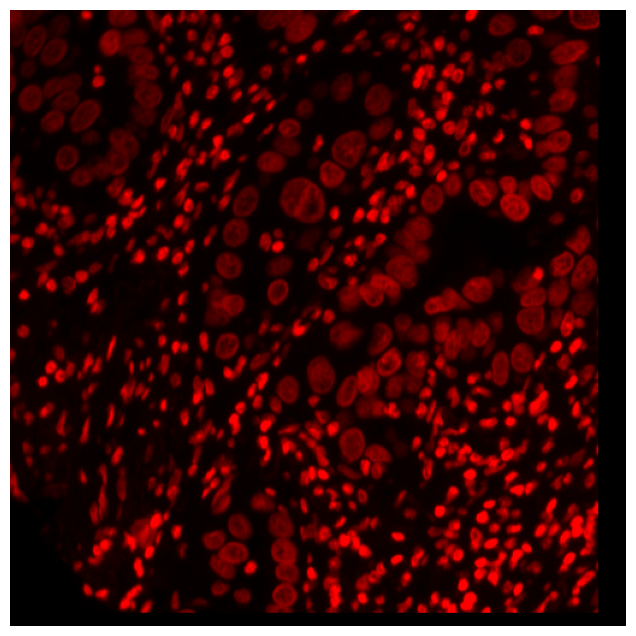

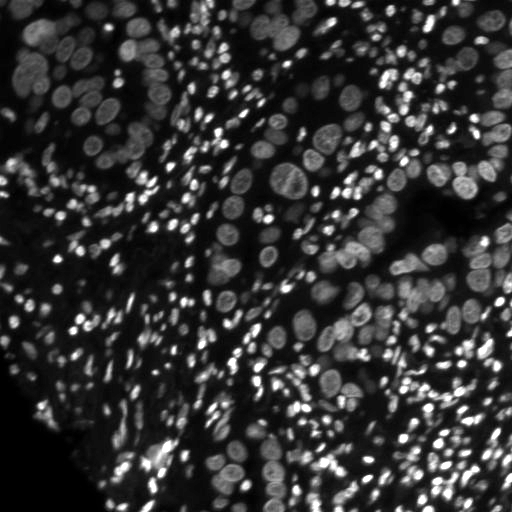

In [273]:
### Your code starts

def apply_affine_transform(
    image:      Image.Image,
    transform:  np.ndarray
):
    """# Apply an affine transformation to an image using pure Python.

    ## Args:
        * image       (PIL.Image.Image):  Input image.
        * transform   (np.ndarray):       3x3 affine transformation matrix.
        * output_size (tuple):            (width, height) of the output image.

    ## Returns:
        * PIL.Image.Image:  Transformed image.
    """
    # Record width & height of input image
    width, height =                   image.size

    # Initialize new Image for output pixels
    transformed_image:  Image =       Image.new("RGB", (width, height))

    # Extract pixel array for transformation
    pixels =                          transformed_image.load()

    # Compute inverse transformation to avoid holes
    inv_transform:      np.ndarray =  np.linalg.inv(transform)

    # For each row of image...
    for x in range(width):

        # For each pixel in row...
        for y in range(height):

            # Map output pixel (x, y) back to input pixel
            src_x, src_y, _ = inv_transform @ np.array([x, y, 1])

            # Use nearest-neighbor interpolation
            src_x, src_y =    int(round(src_x)), int(round(src_y))

            # If new pixel does not fall outside of image...
            if 0 <= src_x < image.width and 0 <= src_y < image.height:

                # Assign new pixel position
                pixels[x, y] = image.getpixel((src_x, src_y))

    # Return transformed image
    return transformed_image

# [2 pt]
img2_trans_aff: np.array =  np.vstack([T_aff, [0, 0, 1]])

# 1. [2 pts] RGB visualization of results
out:            Image =     apply_affine_transform(Image.fromarray(img1), transform = img2_trans_aff)

plt.figure(figsize=(8, 8))
plt.imshow(out)
plt.axis('off')
plt.show();

# 2. [2 pt] gif visualization of results

img2_trans = cv2.warpAffine(img2, T_aff, out.size)
dispGif(img2, img2_trans)

### Your code ends

### (2) [10 pts] Panoroma stitching

--[8 pts] Organize the code in section 2.2 into one function

--[1 pt] Test stitching on two cell images.

--[1 pt] Apply the method to two natrual scene images.

In [274]:
def panoramic_stitching(img1, img2, do_display=True):
  '''
    Given a pair of overlapping images, generate a panoramic image.
    Hint: use the functions that you've written in the previous parts.
    Input:
      img1, img2: cv2 images
    Return:
      final_img: cv2 image of panorama
  '''
  # 1.detect keypoints and extract orb feature descriptors
  kp_1, desc_1 = get_orb_features(img1)
  kp_2, desc_2 = get_orb_features(img2)

  # 2.match features between two images
  matches = match_keypoints(desc_1, desc_2)
  pts_2 = np.vstack([kp_2[m.trainIdx].pt for m in matches])
  pts_1 = np.vstack([kp_1[m.queryIdx].pt for m in matches])


  # 3.compute homography matrix H transforming points from pts_2 to pts_1. Note the order here (not pts_1 to pts_2)!
  T_aff, status = cv2.estimateAffine2D(pts_2, pts_1, cv2.RANSAC)

  # 4. apply perspective wrap to stitch images together
  # use img1 as the canvas
  # rough approximation of the output image size
  output_size = (img2.shape[1] + img1.shape[1], img2.shape[0] + img1.shape[0])

  # warp img2 with H
  final_img = cv2.warpAffine(img2, T_aff, output_size)

  # copy img1 to the final image
  # pixels in img1 remain in the same position in the original position
  final_img[0:img1.shape[0], 0:img1.shape[1]] = img1

  # crop the empty region
  col_sum = final_img.max(axis=0)
  row_sum = final_img.max(axis=1)
  last_col = np.where(col_sum!=0)[0][-1]
  last_row = np.where(row_sum!=0)[0][-1]

  final_img = final_img[:last_row, :last_col]

  if do_display:
    plt.figure(figsize=(16, 8))
    plt.imshow(final_img)
    plt.show()

  return final_img

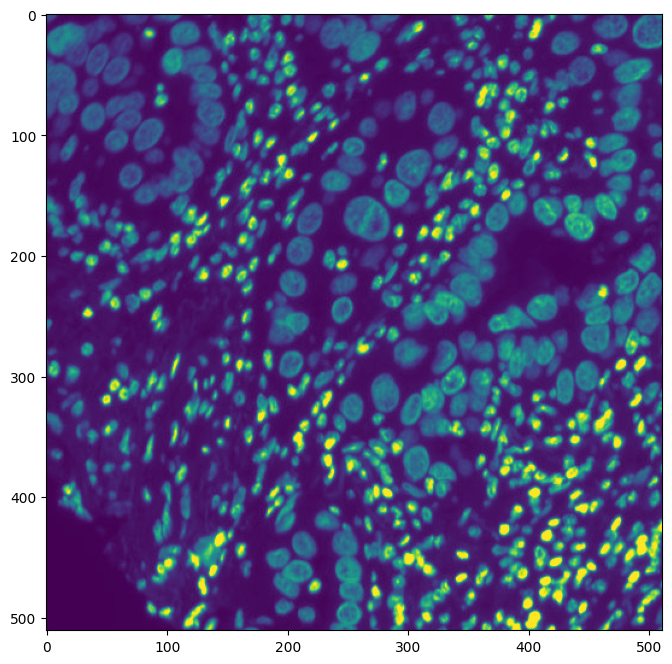

In [275]:

# Align the two images above
result = panoramic_stitching(img1, img2)

<ipython-input-276-89963882974a>:2: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  plotImgPair(imread('view_1.jpg'), imread('view_2.jpg'))


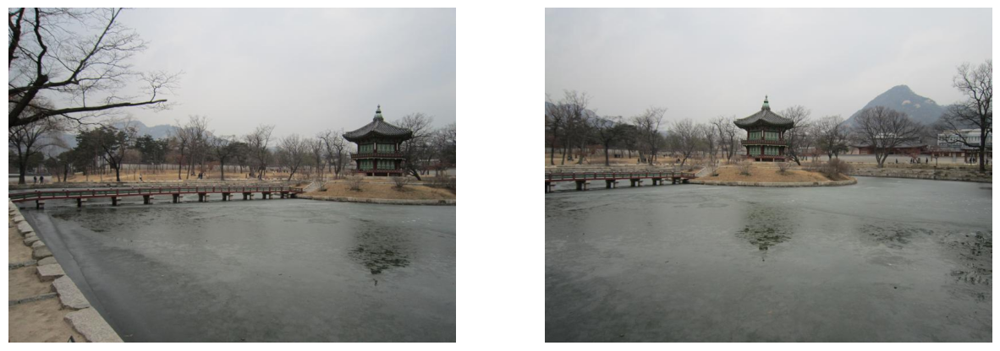

In [276]:
# Let's look at some natural images that are not a simple shift
plotImgPair(imread('view_1.jpg'), imread('view_2.jpg'))

<ipython-input-277-839bfb6d53e6>:1: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  result = panoramic_stitching(imread('view_1.jpg'), imread('view_2.jpg'))


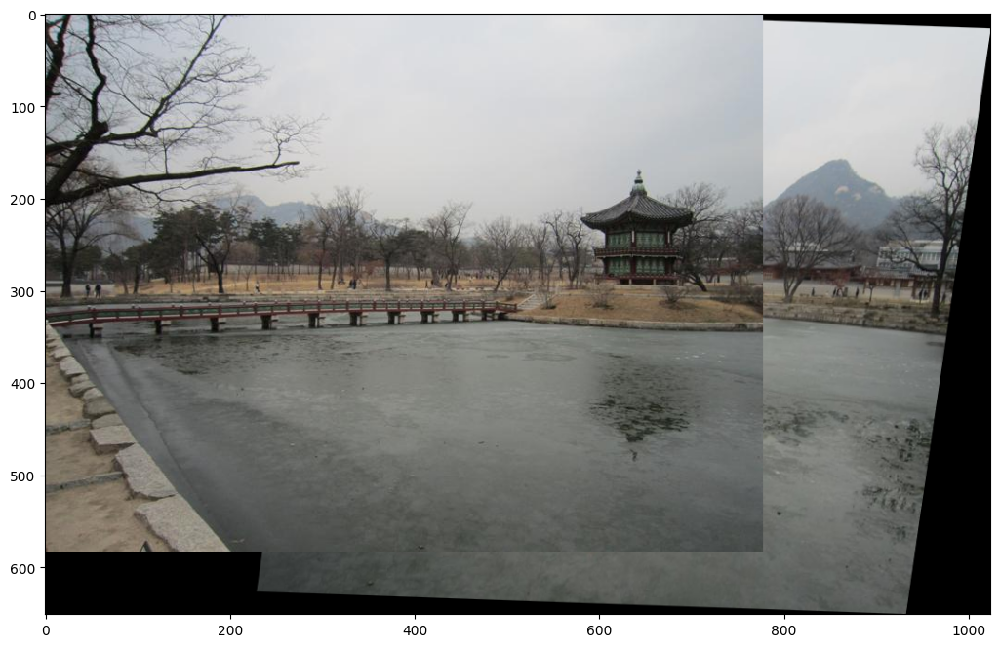

In [277]:
result = panoramic_stitching(imread('view_1.jpg'), imread('view_2.jpg'))

### (3) [8 pts] SIFT

Replace the ORB features with SIFT features in above program. [4 pts]

Generate the stitched image. [2 pt]

Visualize the stitched image to check the correctness. [2 pt]


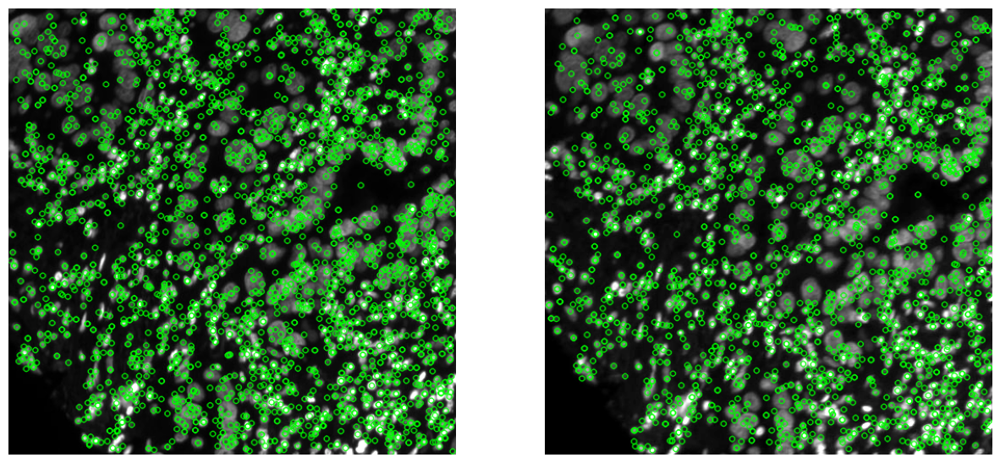

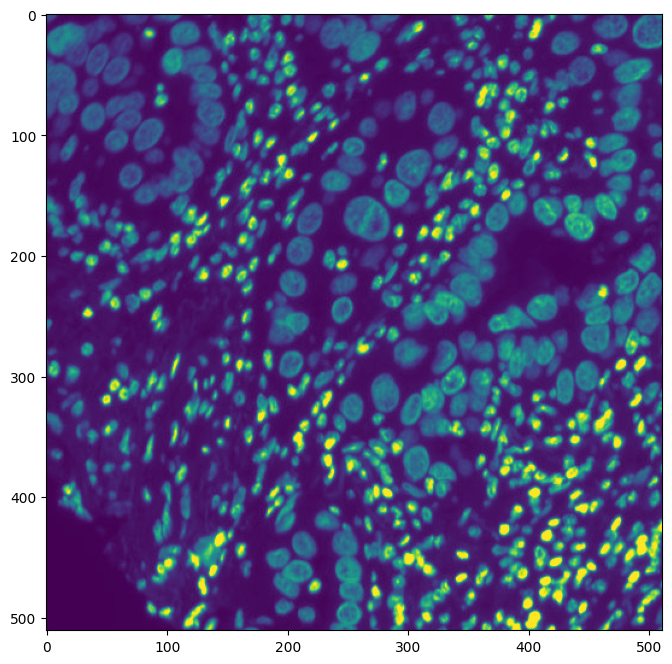

In [278]:
### Your code starts here ###

# 1. Replace the ORB features with SIFT features
def get_sift_features(img):
    '''
    Compute ORB features using cv2 library functions (hint: you will need cv2.ORB_create() and some related functions).  Use default parameters when computing the keypoints.
    Input:
      img: cv2 image
    Returns:
      keypoints: a list of cv2 keypoints
      descriptors: a list of ORB descriptors
    '''
    sift = cv2.SIFT_create()
    keypoints, descriptors = sift.detectAndCompute(img, None)
    return keypoints, descriptors


kp_1, desc_1 = get_sift_features(img1)
kp_2, desc_2 = get_sift_features(img2)

kp_img1 = cv2.drawKeypoints(img1, kp_1, None, color=(0,255,0), flags=0)
kp_img2 = cv2.drawKeypoints(img2, kp_2, None, color=(0,255,0), flags=0)

plotImgPair(kp_img1, kp_img2)

# 2. Generate the stitched image
result = panoramic_stitching(img1, img2, do_display=False)

# 3. Visualize the stitched image to check the accuracy
plt.figure(figsize=(16, 8))
plt.imshow(result)
plt.show()

### Your code ends here ###

# <b>3. Semantic segmentation (8 pts) </b>

<ipython-input-279-e8b0e898df53>:1: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  img1 = autoContrast(imread('examplar-001-01.jpg')[687:787,687:787])


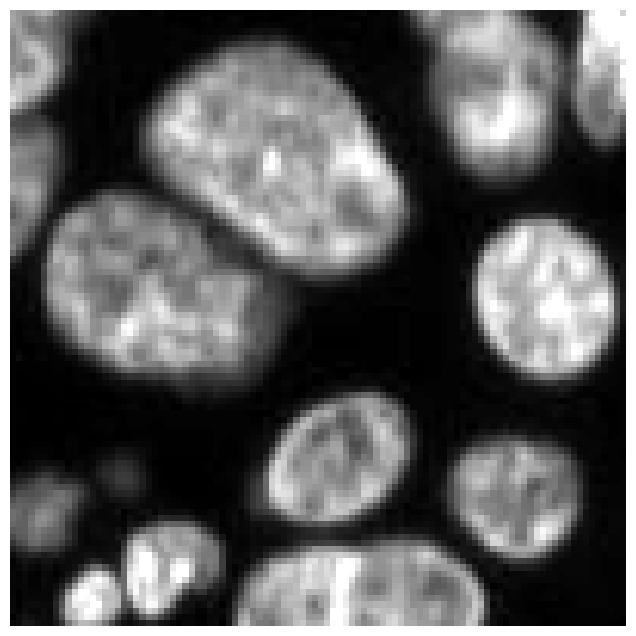

In [279]:
img1 = autoContrast(imread('examplar-001-01.jpg')[687:787,687:787])

plt.figure(figsize=(8, 8))
plt.imshow(img1, cmap='gray')
plt.axis('off')
plt.show()


## 3.1 [2 pts] Naive thresholding

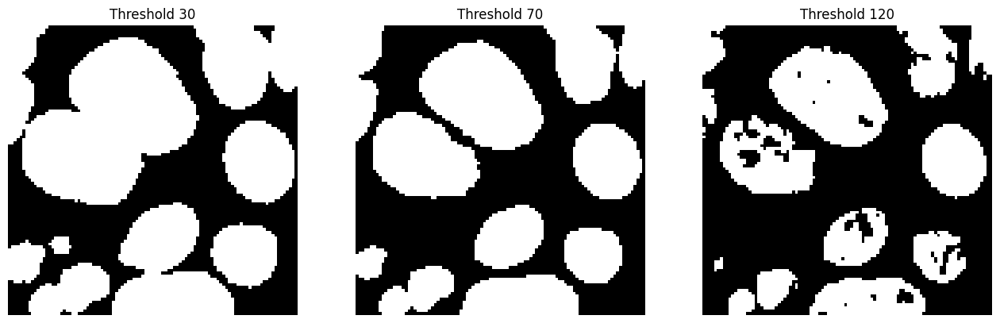

In [280]:
ths = [30,70,120]

plt.figure(figsize=(16, 8))

for i,th in enumerate(ths):
    ### Your code starts here ###

    # Perform semantic naive thresholding segmentation
    seg_semantic: np.ndarray =  img1 > th

    ### Your code ends here ###
    plt.subplot(1,3,i+1)
    plt.imshow(seg_semantic, cmap='gray')
    plt.title('Threshold %d' % th)
    plt.axis('off')


## 3.2 [6 pts] Otsu thresholding

In practice, we can apply a Gaussian filter to denoise the image a bit, so that the two classes can be better separated.

<img src="https://docs.opencv.org/4.x/otsu.jpg">

[More details](https://docs.opencv.org/4.x/d7/d4d/tutorial_py_thresholding.html)

**You are allowed to use functions from cv2 library.**


(-0.5, 99.5, 99.5, -0.5)

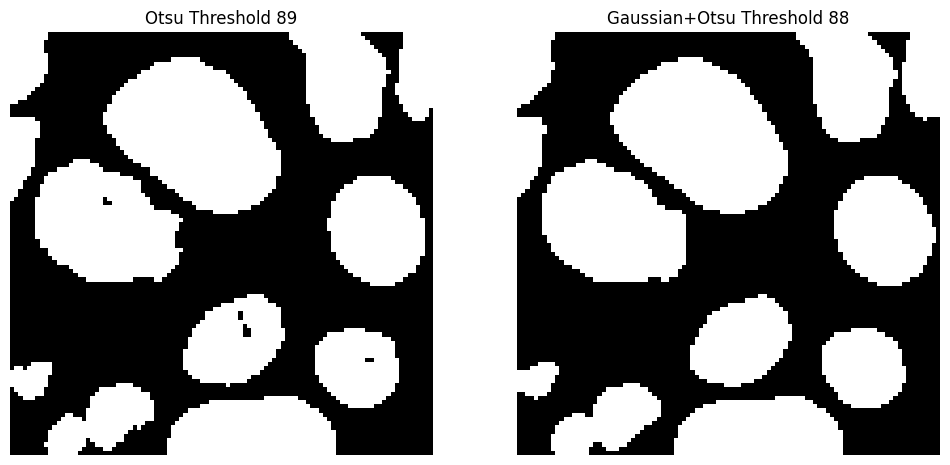

In [281]:
import cv2

# You are allowed to use functions from cv2 library.

### Your code starts here ###
# Calculate direct Otsu
th_otsu, img1_otsu =                        cv2.threshold(img1, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)

# Impose Gaussian blur on Otsu output
img1_blur:                    np.ndarray =  cv2.GaussianBlur(img1,(5,5),0)
th_blur_otsu, img1_blur_otsu =              cv2.threshold(img1_blur, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)

### Your code ends here ###

plt.figure(figsize=(12, 8))
plt.subplot(121)
plt.imshow(img1_otsu, cmap='gray')
plt.title('Otsu Threshold %d' % th_otsu)
plt.axis('off')
plt.subplot(122)
plt.imshow(img1_blur_otsu, cmap='gray')
plt.title('Gaussian+Otsu Threshold %d' % th_blur_otsu)
plt.axis('off')

# <b>4. Instance segmentation (8 pts) </b>

## 4.1 Connected component

Notice that thare are some segments have false merge error.


(-0.5, 99.5, 99.5, -0.5)

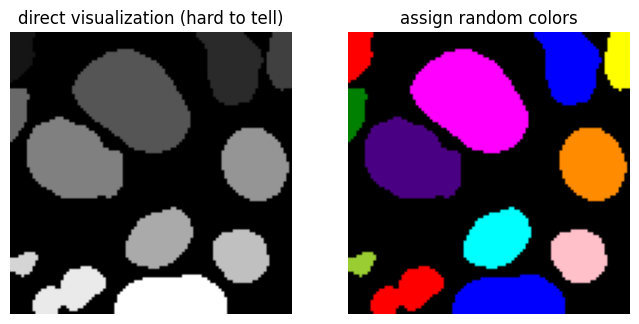

In [282]:
from skimage.measure import label
from skimage.color import label2rgb


seg_inst = label(img1_blur_otsu)

plt.figure(figsize=(8, 8))
plt.subplot(121)
plt.imshow(seg_inst, cmap='gray')
plt.title('direct visualization (hard to tell)')
plt.axis('off')
plt.subplot(122)
plt.imshow(label2rgb(seg_inst, bg_label=0))
plt.title('assign random colors')
plt.axis('off')


## 4.2 Watershed


### Step 1. [4 pts] Distance transform

**You are allowed to use functions from scipy library.**



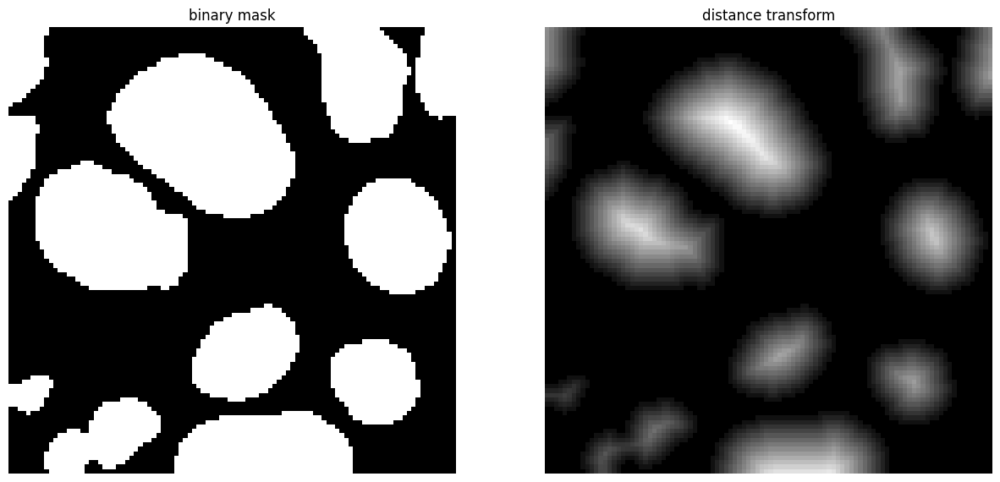

In [283]:
from scipy import ndimage as ndi

### Your code starts here ###

# Calculate distance transform
distance: np.ndarray =  ndi.distance_transform_edt(img1_blur_otsu)

# Plot image pair
plotImgPair(img1_blur_otsu, distance, title=['binary mask', 'distance transform'])

### Your code ends here ###


### Step 2. Find local optima


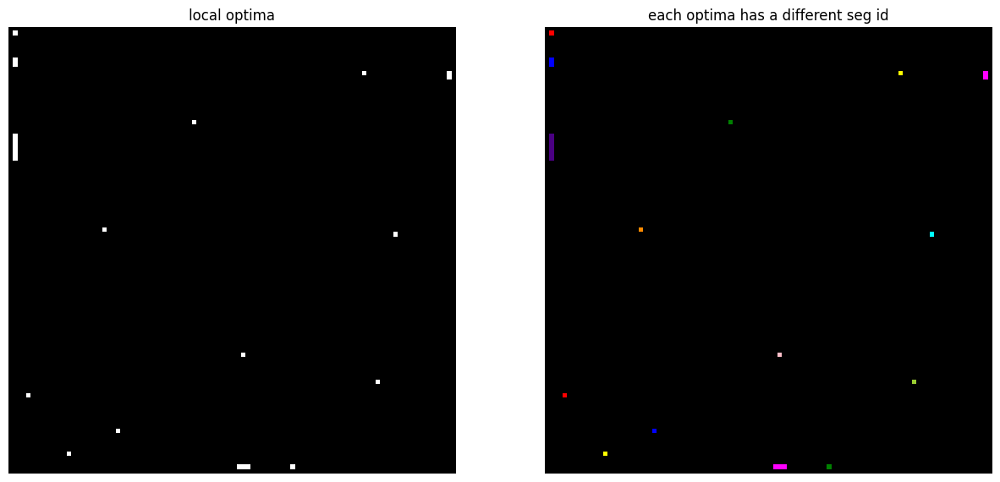

In [284]:
from skimage.feature import peak_local_max

# partially determined by the size of a cell
optima_window_size = 15

coords = peak_local_max(distance,\
                        footprint=np.ones((optima_window_size, optima_window_size)),\
                        labels=img1_blur_otsu)
mask = np.zeros(distance.shape, dtype=bool)
mask[tuple(coords.T)] = True
markers, _ = ndi.label(mask)

# the points are small
plotImgPair(mask, label2rgb(markers, bg_label=0), title=['local optima','each optima has a different seg id'])

### Step 3. Watershed transform

It fixes the false merge, but introduces some false splits...

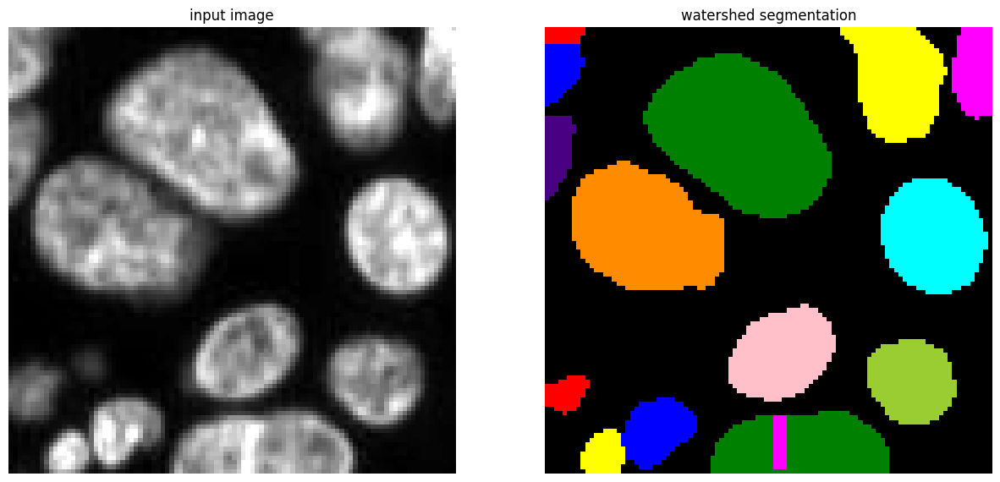

In [285]:
from skimage.segmentation import watershed
seg_watershed = watershed(-distance, markers, mask=img1_blur_otsu)
plotImgPair(img1, label2rgb(seg_watershed, bg_label=0), title=['input image','watershed segmentation'])

## 4.3 Graph-based Segmentation

https://docs.opencv.org/3.4/d8/d83/tutorial_py_grabcut.html

### Rectangle mask

--2025-02-24 22:29:16--  https://raw.githubusercontent.com/hzaoheng123/HZ/main/teaching/sample_images/messi.png
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 327566 (320K) [image/png]
Saving to: ‘messi.png’

messi.png           100%[===================>] 319.89K  --.-KB/s    in 0.04s   

2025-02-24 22:29:16 (7.26 MB/s) - ‘messi.png’ saved [327566/327566]



<ipython-input-286-5bdebae85a71>:3: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  img = imread('messi.png')


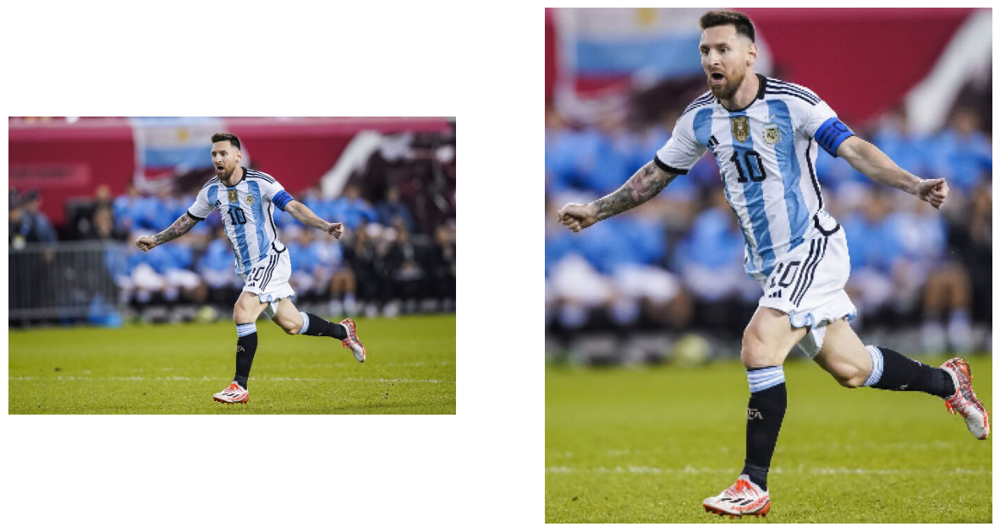

In [286]:
! wget -O messi.png https://raw.githubusercontent.com/hzaoheng123/HZ/main/teaching/sample_images/messi.png

img = imread('messi.png')
rect = (161,20,320,370)
plotImgPair(img, img[rect[1]:rect[1]+rect[3], rect[0]:rect[0]+rect[2]])

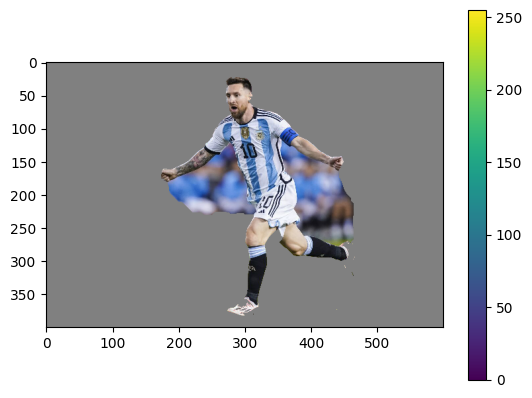

(<matplotlib.image.AxesImage at 0x78a65624a290>,
 None)

In [287]:
import cv2

# zero initialization
mask = np.zeros(img.shape[:2],np.uint8)
bgdModel = np.zeros((1,65),np.float64)
fgdModel = np.zeros((1,65),np.float64)
num_iter = 5


cv2.grabCut(img, mask, rect, bgdModel,fgdModel,num_iter,cv2.GC_INIT_WITH_RECT)

img2 = img.copy()
# find background region
mask_bg = np.tile(((mask==2)+(mask==0)).astype('uint8')[:,:,None], [1,1,3])
img2[mask_bg>0] = 128
plt.imshow(img2),plt.colorbar(),plt.show()

### [4 pts] Add manual correction

**Try to manipulate this GUI and draw positive and negative regions. Check the results. Is it better?**

The mask above is a good initialization. However, the legs are missing and the area under the arms are not part of the body.

We will use the following GUI to
- pick the green color and mark the skeleton of the human (teach GrabCut that these pixels are foreground)
- pick the red color and mark the area under the arm (teach GrabCut that these pixels are background)
- save the image

A sample mask image looks like this: <img width=200 src="https://bc-cv.github.io/csci3397/public/dip_morph/messi_mask.png"/>

Acknowledgement: GUI code is based on https://gist.github.com/rickkk856/6a2800cc84dd8fd456074e5a467edc47

In [288]:
import ipywidgets as widgets
from ipywidgets import Layout, Button, Box
from IPython.display import display, HTML, Image
from google.colab.output import eval_js
from base64 import b64decode

Canvas_Size = img.shape[:2]
Brush_Size = 10 #@param {type:"slider", min:0, max:100, step:5}
Button_Size = 50
filename = "messi_mask"#@param [] {allow-input: true}
filename = filename + ".png"


def getJS(width, height, brush_size, button_size):
  js_code = '''
  <style>
    .colors-buttons div {
        width: 30px;
        height: 30px;
        margin: 2px;}
    div {
        display: flex;
        border:1px solid black;
    }

  #container{
      display:inline-block;
      width: '''+str(width)+'''px;
      height: '''+str(height)+'''px;
      margin: 0 -0px;
      background: white;
      position:relative;
      border:1px solid black; }

  .img{position:absolute;z-index:1;opacity:0.5}

  #gameCanvas{
      position:relative;
      z-index:20;
  }
  </style>
  <div id="container">
      <img src="https://bc-cv.github.io/csci3397/public/dip_morph/messi.png" class='img'>
      <canvas id="gameCanvas" width="'''+str(width)+'''" height="'''+str(height)+'''"></canvas>
  </div>

  <div class="colors-buttons">
    <div class="color" style="background-color: #00FF00;" id-color="#00FF00"></div>
    <div class="color" style="background-color: #FF0000;" id-color="#FF0000"></div>
  </div>

  <script>
    var canvas = document.querySelector('canvas')
    var ctx = canvas.getContext('2d')
    var Brush_Size = '''+str(brush_size)+'''

    var button = document.querySelector('button')
    var mouse = {x: 0, y: 0}


    canvas.addEventListener('mousemove', function(e) {
      mouse.x = e.pageX - this.offsetLeft - '''+str(button_size)+'''
      mouse.y = e.pageY - this.offsetTop
    })
    canvas.onmousedown = ()=>{
      ctx.beginPath()
      ctx.moveTo(mouse.x, mouse.y)

      canvas.addEventListener('mousemove', onPaint)
    }
    canvas.onmouseup = ()=>{
      canvas.removeEventListener('mousemove', onPaint)
    }
    var onPaint = ()=>{

      ctx.fillRect(mouse.x-( Brush_Size/2), mouse.y-(Brush_Size/2), Brush_Size, Brush_Size)

      ctx.stroke()
    }
    ctx.fillStyle = "00FF00";
    const colors = document.getElementsByClassName('color');
    Array.from(colors).forEach(color => {
      color.addEventListener('click', (event) => {
          const colorSelected = event.target.getAttribute('id-color');
          ctx.fillStyle = colorSelected;
      });
  });

      // FINISH BUTTON
    var data = new Promise(resolve=>{
      button.onclick = ()=>{
        resolve(canvas.toDataURL('image/jpg'))
      }
    })
  </script>
  '''
  return js_code


## Function to Appear Image Canvas
def draw(filename=filename,  w=100, h=100, Brush_Size=Brush_Size):
  display(HTML(getJS(w, h, Brush_Size, Button_Size)))
  data = eval_js("data")
  binary = b64decode(data.split(',')[1])
  if AttributeError:
    pass
  with open(filename, 'wb') as f:
    f.write(binary)
  return len(binary)

## Action for Reset Button
def on_button_clicked(b):
  with output:
    data = eval_js("data")
    binary = b64decode(data.split(',')[1])
    with open(filename, 'wb') as f:
      f.write(binary)
  return len(binary)
  if button2.on_click(on_button_clicked2):
    pass


## Show Save Button & Save outputs
button = widgets.Button(description="Save", layout=Layout(width='%dpx'%Button_Size, height='%dpx'%Button_Size))
button.on_click(on_button_clicked)
output = widgets.Output()
display(button, output)

## Show Canvas for the First Time
draw(filename=filename,  w=Canvas_Size[1], h=Canvas_Size[0], Brush_Size=Brush_Size)
print("Image Saved at")

Button(description='Save', layout=Layout(height='50px', width='50px'), style=ButtonStyle())

Output()

KeyboardInterrupt: 

Visualize the labeled mask

In [289]:
# you can optionally download the mask directly
# ! wget https://bc-cv.github.io/csci3397/public/dip_morph/messi_mask.png -O messi_mask.png
plotImgPair(imread('messi_mask.png')[:,:,0],imread('messi_mask.png')[:,:,1], title=['background','foreground'])

<ipython-input-289-bbbc622082d4>:3: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  plotImgPair(imread('messi_mask.png')[:,:,0],imread('messi_mask.png')[:,:,1], title=['background','foreground'])


FileNotFoundError: No such file: '/content/messi_mask.png'

In [290]:
import cv2

bgdModel = np.zeros((1,65),np.float64)
fgdModel = np.zeros((1,65),np.float64)

# mask initialization
mask_rect2 = mask.copy()
mask_manual = imread('messi_mask.png')
# background
mask_rect2[mask_manual[:,:,0]>200] = 0
# foreground
mask_rect2[mask_manual[:,:,1]>200] = 1


mask_manual_out, bgdModel, fgdModel = cv2.grabCut(img, mask_rect2, None, bgdModel,fgdModel, num_iter, cv2.GC_INIT_WITH_MASK)
mask_manual_out = np.tile(np.where((mask_manual_out==2)|(mask_manual_out==0),0,1).astype('uint8')[:,:,None], [1,1,3])
img2 = img.copy()
img2[mask_manual_out==0] = 128
plt.imshow(img2)
plt.show()

<ipython-input-290-8a719a42faf7>:8: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  mask_manual = imread('messi_mask.png')


FileNotFoundError: No such file: '/content/messi_mask.png'

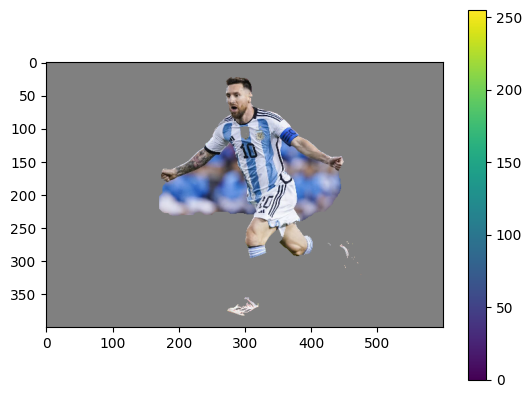

(<matplotlib.image.AxesImage at 0x78a65645e850>,
 None)

In [291]:
import cv2

# zero initialization
mask = np.zeros(img.shape[:2],np.uint8)
bgdModel = np.zeros((1,65),np.float64)
fgdModel = np.zeros((1,65),np.float64)
num_iter = 5


cv2.grabCut(img, mask, rect, bgdModel,fgdModel,num_iter,cv2.GC_INIT_WITH_RECT)

img2 = img.copy()
# find background region
mask_bg = np.tile(((mask==2)+(mask==0)).astype('uint8')[:,:,None], [1,1,3])
img2[mask_bg>0] = 128
plt.imshow(img2),plt.colorbar(),plt.show()

# <b> 5. Morphology Operations (14 pts) </b>

In [299]:
! wget -O binary_hole.png https://raw.githubusercontent.com/hzaoheng123/HZ/main/teaching/sample_images/binary_hole.png

! wget -O binary_noise.png https://raw.githubusercontent.com/hzaoheng123/HZ/main/teaching/sample_images/binary_noise.png

! wget -O binary_fm.png https://raw.githubusercontent.com/hzaoheng123/HZ/main/teaching/sample_images/binary_fm.png

! wget -O binary_fs.png https://raw.githubusercontent.com/hzaoheng123/HZ/main/teaching/sample_images/binary_fs.png

! wget -O cell.png https://raw.githubusercontent.com/hzaoheng123/HZ/main/teaching/sample_images/cell.png


--2025-02-24 22:34:38--  https://raw.githubusercontent.com/hzaoheng123/HZ/main/teaching/sample_images/binary_hole.png
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 8193 (8.0K) [image/png]
Saving to: ‘binary_hole.png’

binary_hole.png     100%[===================>]   8.00K  --.-KB/s    in 0s      

2025-02-24 22:34:38 (36.8 MB/s) - ‘binary_hole.png’ saved [8193/8193]

--2025-02-24 22:34:38--  https://raw.githubusercontent.com/hzaoheng123/HZ/main/teaching/sample_images/binary_noise.png
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Lengt

## 5.1 Basic operations

**You are allowed to call functions from scipy libirary.**


In [300]:
from scipy.ndimage.morphology import binary_fill_holes
from scipy.ndimage.morphology import binary_erosion,binary_dilation
from scipy.ndimage.morphology import binary_closing,binary_opening

<ipython-input-300-a4867cf6612e>:1: DeprecationWarning: Please import `binary_fill_holes` from the `scipy.ndimage` namespace; the `scipy.ndimage.morphology` namespace is deprecated and will be removed in SciPy 2.0.0.
  from scipy.ndimage.morphology import binary_fill_holes
<ipython-input-300-a4867cf6612e>:2: DeprecationWarning: Please import `binary_erosion` from the `scipy.ndimage` namespace; the `scipy.ndimage.morphology` namespace is deprecated and will be removed in SciPy 2.0.0.
  from scipy.ndimage.morphology import binary_erosion,binary_dilation
<ipython-input-300-a4867cf6612e>:2: DeprecationWarning: Please import `binary_dilation` from the `scipy.ndimage` namespace; the `scipy.ndimage.morphology` namespace is deprecated and will be removed in SciPy 2.0.0.
  from scipy.ndimage.morphology import binary_erosion,binary_dilation
<ipython-input-300-a4867cf6612e>:3: DeprecationWarning: Please import `binary_closing` from the `scipy.ndimage` namespace; the `scipy.ndimage.morphology` nam

### [2 pts] Fill holes


<ipython-input-301-42a4f573597b>:1: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  im_hole = imread('binary_hole.png')


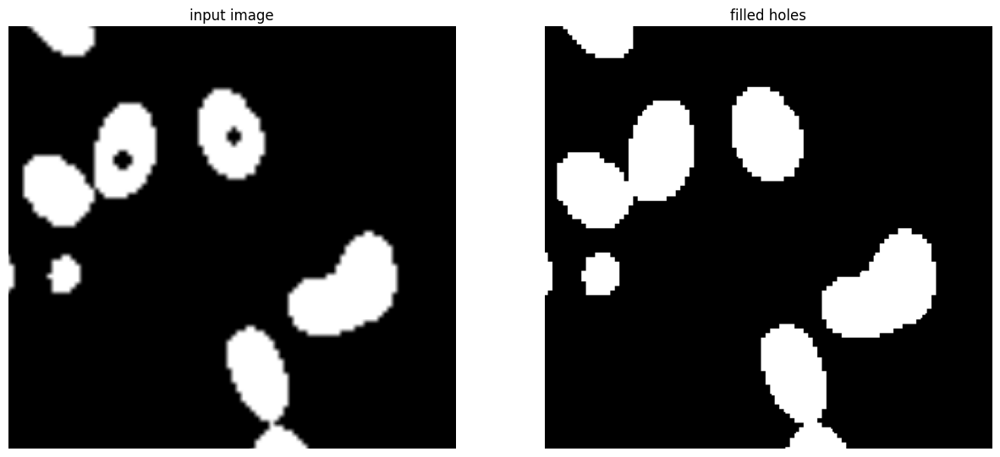

In [301]:
im_hole = imread('binary_hole.png')

### Your code starts here ###

# Fill holes in image
im_hole_out:  np.ndarray =  binary_fill_holes(im_hole)

# Plot image pair
plotImgPair(im_hole, im_hole_out, title=['input image', 'filled holes'])

### Your code ends here ###


### [2 pts] Erosion: remove noise

<ipython-input-302-4b2c32657694>:1: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  im_noise = imread('binary_noise.png')


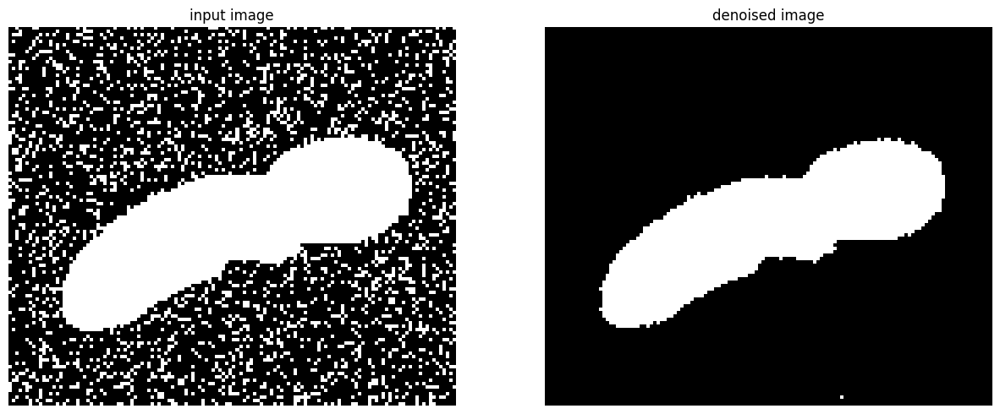

In [302]:
im_noise = imread('binary_noise.png')

### Your code starts here ###

# Apply erosion to image using scipy
im_noise_out:  np.ndarray =  binary_erosion(im_noise)

# Plot image pair
plotImgPair(im_noise, im_noise_out, title=['input image', 'denoised image'])

### Your code ends here ###

### [2 pts] Dilation: fix false split

<ipython-input-303-6cd9142908c5>:1: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  im_fs = imread('binary_fs.png')


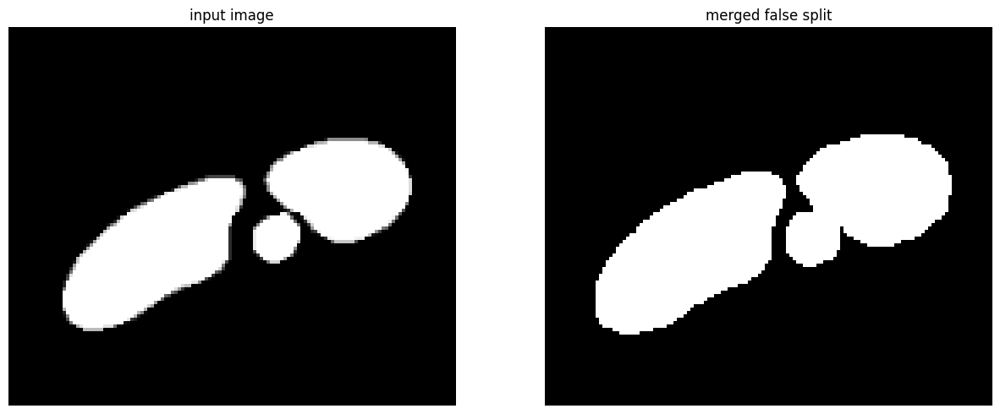

In [303]:
im_fs = imread('binary_fs.png')

### Your code starts here ###

# Apply dilation to image using scipy
im_fs_out:  np.ndarray =  binary_dilation(im_fs)

# Plot image pair
plotImgPair(im_fs, im_fs_out, title=['input image', 'merged false split'])

### Your code ends here ###

## 5.2 Composite operations

### [4 pts] Closing: fix false splits + preserve shape


<ipython-input-304-9eea14ba28fe>:1: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  im_fs = imread('binary_fs.png')


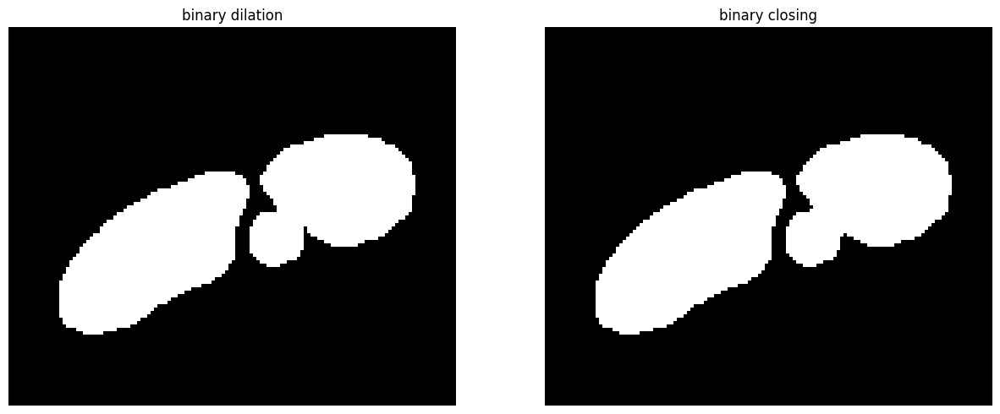

In [304]:
im_fs = imread('binary_fs.png')

### Your code starts here ###

# Perform binary dilation
im_fs_close:  np.ndarray = binary_dilation(im_fs)

# Perform binary closing
im_fs_close2: np.ndarray = binary_closing(im_fs_close)

# Plot image pair
plotImgPair(im_fs_close, im_fs_close2, title=['binary dilation', 'binary closing'])

### Your code ends here ###


### [4 pts] Opening: fix false merge + preserve shape


<ipython-input-305-2261342c44e8>:1: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  im_fm = imread('binary_fm.png')


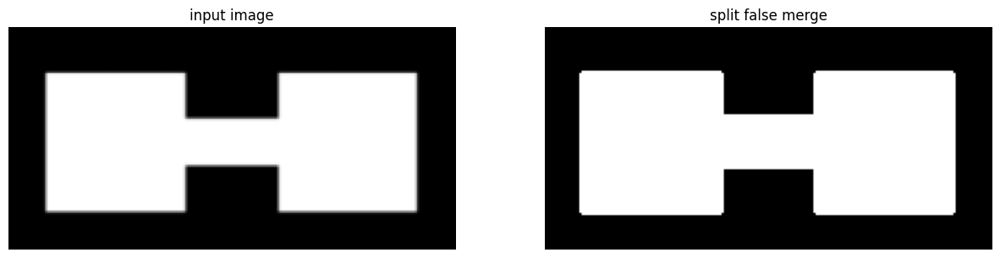

In [305]:
im_fm = imread('binary_fm.png')

### Your code starts here ###

# Fix false merge
im_fm_open: np.ndarray = binary_opening(im_fm)

# Fix false split
im_fm_open2: np.ndarray = binary_closing(im_fm_open)

# Plot image pair
plotImgPair(im_fm, im_fm_open, title=['input image', 'split false merge'])

### Your code starts here ###

# <b> 6. Segmentation excercise (24 pts) </b>


Let's apply what we learnt above to a new type of cell image.
- The cell borders are white now. The segments within the white borders are cells
- No need to get perfect results. Something reasonable is good


<ipython-input-311-30022e9abbe8>:1: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  im = imread('cell.png')


(-0.5, 499.5, 299.5, -0.5)

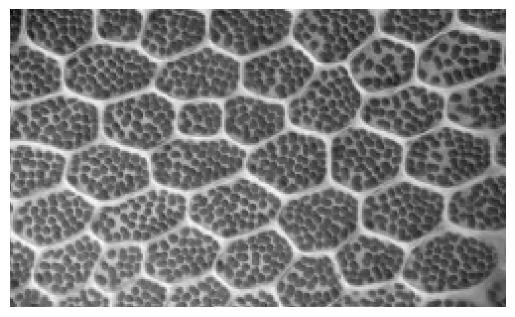

In [311]:
im = imread('cell.png')
plt.imshow(im, cmap='gray')
plt.axis('off')

## (1) [4 pts] semantic segmentation

Compute the binary image where the cell segments are 1 and background 0.

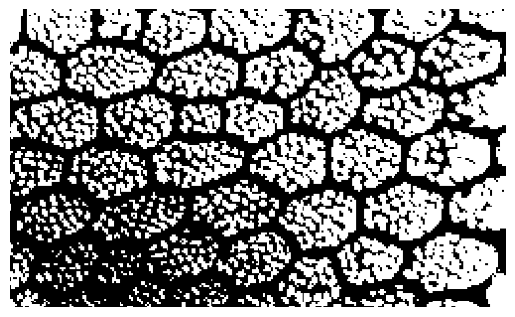

In [315]:
### Your code starts here

# Apply semantic segmentation

# Convert to binary image
im_seg_semantic:  np.ndarray =  im < 110

### Your code ends here

plt.imshow(im_seg_semantic, cmap='gray')
plt.axis('off')
plt.show()

## (2) [6 pts] Instance segmentation

Based on the semantic segmentation in (1), use connected-component method to assign indivisual cells to different segment ids and visualize them in random colors. (okay to have errors).

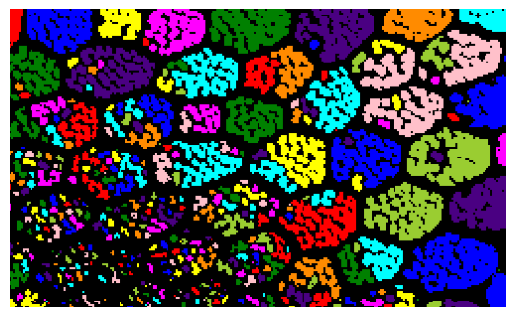

In [320]:
### Your code starts here

# Apply instance segmentation
seg_inst, _ =                 label(im_seg_semantic)

# Apply color instance segmentation
seg_inst_color: np.ndarray =  label2rgb(seg_inst, bg_label=0)

### Your code ends here

plt.imshow(seg_inst_color)
plt.axis('off')
plt.show()


## (3) [10 pts] Watershed segmentation

Based on the semantic segmentation in (1), apply the watershed segmentation for the cells.


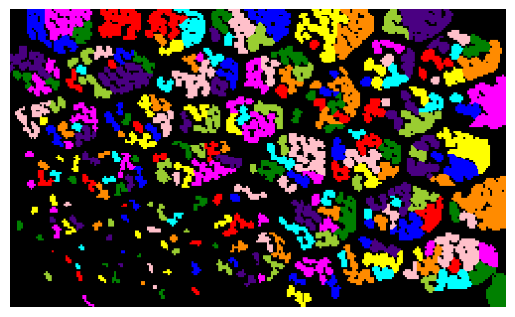

In [321]:
### Your code starts here

from scipy.ndimage  import label

# [2 pt] binary semantic segmentation
im_seg_semantic:  np.ndarray =  im < 110

# [2 pt] distance transform
distance:         np.ndarray =  distance_transform_edt(im_seg_semantic)

# [2 pt] find local optima
local_optima:     np.ndarray =  peak_local_max(distance, min_distance=10)
mask:             np.ndarray =  np.zeros(distance.shape, dtype=bool)
mask[tuple(local_optima.T)] =   True
markers, _ =                    label(mask)

# [2 pt] watershed transform
seg_watershed:    np.ndarray =  watershed(-distance, markers, mask=im_seg_semantic)

# [2 pt] visualize segmentation result
plt.imshow(label2rgb(seg_watershed, bg_label=0))
plt.axis('off')
plt.show()

### Your code ends here

## (4) [4 pts] Post-processing

If your results from (3) are not good enough, what morphology operations can be applied to achieve better performance? The extract the boundary map of all cells and visualize the boundary map.

If your results are perfect, then extract the boundary map of all cells and visualize the boundary map.

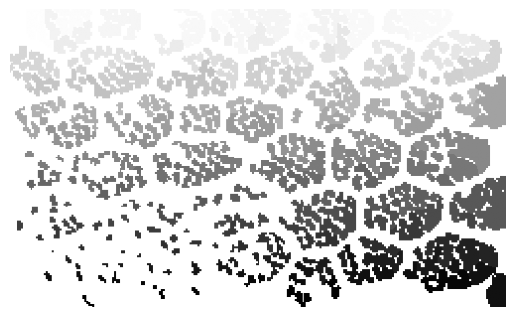

In [322]:
### Your code starts here

# Extract the boundary map
boundary_map: np.ndarray =  binary_dilation(seg_watershed) - seg_watershed

# Visualize the boundary map
plt.imshow(boundary_map, cmap='gray')
plt.axis('off')
plt.show()

### Your code ends here